In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import cv2
import csv
import time
import tensorflow as tf
import keras
import glob
from PIL import Image
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Input, Activation,Concatenate
from tensorflow.keras.layers import BatchNormalization, LeakyReLU, Flatten, Dense, Dropout, UpSampling2D
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.figure import Figure
from mpl_toolkits.axes_grid1 import ImageGrid
from pprint import pprint
%matplotlib inline
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
from tensorflow.keras.callbacks import EarlyStopping
import logging
logging.getLogger('tensorflow').disabled = True
import warnings
warnings.filterwarnings('ignore', category=UserWarning)
import random

# Preparation and presentation of datasets

### Acquire and Preprocess Dataset

In [2]:
BATCH_SIZE = 16

train_dir = '../dataset/train/'
valid_dir = '../dataset/validation/'

train_files = glob.glob(train_dir + '*_normal_*.png')
valid_files = glob.glob(valid_dir + '*_normal_*.png')

def preprocess(images):
    images = tf.image.resize(images, [256, 256])
    images = tf.cast(images, tf.float32)
    images = (images - 127.5) / 127.5 # [-1, 1]
    return images


def load_and_preprocess_image(file_path):
    # print("file_path", file_path)
    # Load the image from file
    image = tf.io.read_file(file_path)
    # Decode the image to a tensor
    image = tf.image.decode_jpeg(image, channels=3)
    # Preprocess the image
    image = preprocess(image)
    return image


def normalise(images):
    images,images_norm = tf.linalg.normalize(images, axis=2) #Normalise the input data
    return images


train_dataset = tf.data.Dataset.from_tensor_slices(train_files)
valid_dataset = tf.data.Dataset.from_tensor_slices(valid_files)

train_dataset = train_dataset.map(load_and_preprocess_image)
valid_dataset = valid_dataset.map(load_and_preprocess_image)

train_dataset = train_dataset.map(normalise)
valid_dataset = valid_dataset.map(normalise)

print("Training dataset size:", len(train_files))
print("Validation dataset size:", len(valid_files))

img = train_dataset.take(1)
train_dataset_width = int(img.element_spec.shape[0])
train_dataset_height = int(img.element_spec.shape[1])

train_dataset = train_dataset.shuffle(len(train_files)).batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
valid_dataset = valid_dataset.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

print("Total number of batches in training dataset:", len(list(train_dataset)))
print("Total number of batches in validation dataset:", len(list(valid_dataset)))

print("train dataset: ", tf.data.DatasetSpec.from_value(train_dataset))
print("valid dataset: ", tf.data.DatasetSpec.from_value(valid_dataset))

train_dataset = train_dataset.prefetch(100).cache()

Training dataset size: 1296
Validation dataset size: 162
Total number of batches in training dataset: 81
Total number of batches in validation dataset: 11
train dataset:  DatasetSpec(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorShape([]))
valid dataset:  DatasetSpec(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorShape([]))


### Show some images on the train dataset

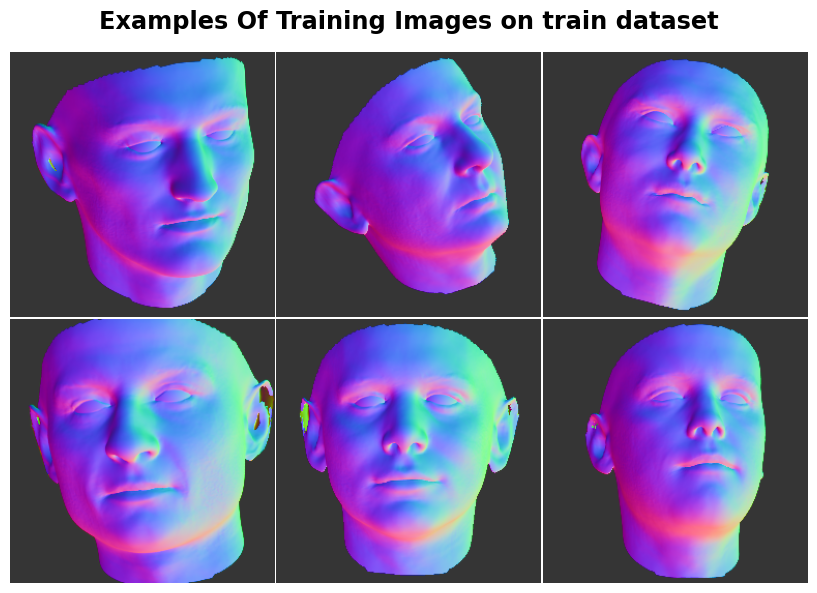

In [3]:
for images in train_dataset.take(1):
    for ax, img in zip(ImageGrid(plt.figure(figsize=(9, 6)), 111, nrows_ncols=(2, 3)), images):
        ax.imshow((img+1)/2)
        ax.axis('off')
plt.suptitle('Examples Of Training Images on train dataset', fontsize='xx-large',fontweight='heavy')
plt.tight_layout()
plt.show()

### Show some images on the test dataset

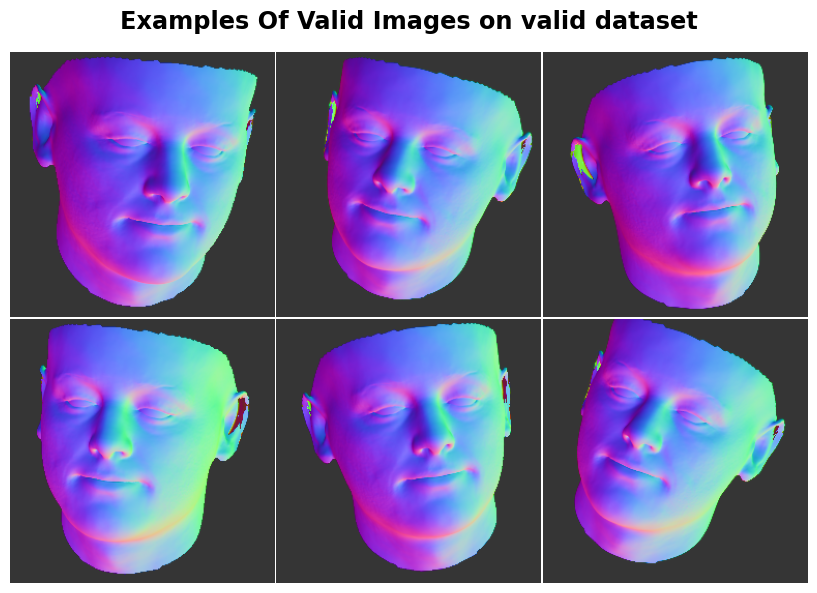

In [4]:
for images in valid_dataset.take(1):
    for ax, img in zip(ImageGrid(plt.figure(figsize=(9, 6)), 111, nrows_ncols=(2, 3)), images):
        ax.imshow((img+1)/2)
        ax.axis('off')
plt.suptitle('Examples Of Valid Images on valid dataset', fontsize='xx-large',fontweight='heavy')
plt.tight_layout()
plt.show()

# Mask Code Set

### Generate Irregular Mask (batch size)

In [5]:
def mask_irregular(batch_size, mask_width, mask_height):
    
    size = int(round((mask_width + mask_height) * 0.03))
    mask = np.zeros((batch_size,mask_width,mask_height,1))
    
    for _ in range(np.random.randint(1, 20)):
        
        x1, x2 = np.random.randint(1, mask_width, batch_size), np.random.randint(1, mask_width, batch_size)
        y1, y2 = np.random.randint(1, mask_height, batch_size), np.random.randint(1, mask_height, batch_size)
        thickness = np.random.randint(1, size, batch_size)
        
        for i in range(batch_size):
            cv2.line(mask[i],(x1[i], y1[i]),(x2[i],y2[i]),(1,1,1), thickness[i])

    return np.float32(((1 - mask)*2) - 1) # [-1, 1]

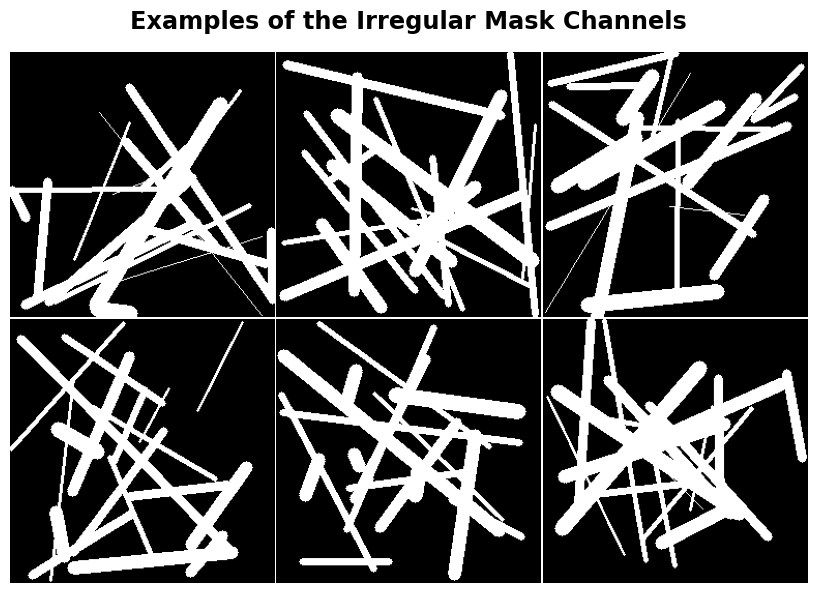

In [6]:
irregular_mask_examples = mask_irregular(6, train_dataset_width, train_dataset_height)

for ax, img in zip(ImageGrid(plt.figure(figsize=(9, 6)), 111, nrows_ncols=(2, 3)), 
                   irregular_mask_examples):
    ax.imshow((img+1)/2, cmap='binary')
    ax.axis('off')
plt.suptitle('Examples of the Irregular Mask Channels', fontsize='xx-large',fontweight='heavy')
plt.tight_layout()
plt.show()

### Generate the masked imgs (batch size)

In [7]:
def masked_imgs(raw_imgs, mask_channels):
    
    raw_imgs = (raw_imgs + 1.0) / 2.0 # [0, 1]
    mask_channels = (mask_channels + 1.0) / 2.0 # [0, 1]
    
    # masked_images = np.multiply(raw_imgs, mask_channels)
    masked_images = tf.multiply(raw_imgs, mask_channels)  # 使用 tf.multiply 替代 np.multiply
    
    masked_images = (masked_images * 2.0) - 1.0 # [-1, 1]
    
#     masked_images[:][masked_images[:] == 0] = 1. # Set the white mask
    
    return masked_images

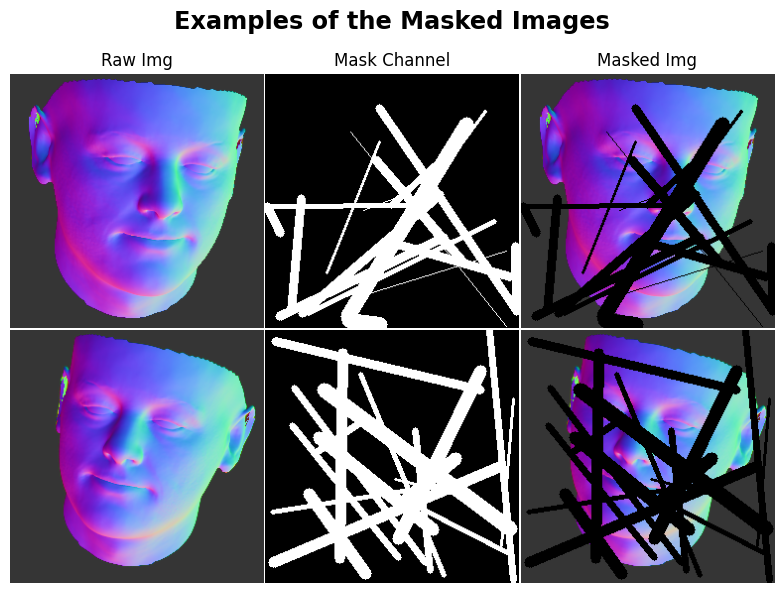

In [8]:
for images_batch in valid_dataset.take(1):
    raw_images_examples = images_batch[:2]

irregular_mask_examples = irregular_mask_examples[:2]
masked_images_examples = masked_imgs(raw_images_examples, irregular_mask_examples)

grid = ImageGrid(plt.figure(figsize=(9, 6)), 111, nrows_ncols=(2, 3))

for i in range(2):
    ax = grid[i*3]
    ax.imshow((raw_images_examples[i]+1)/2)
    ax.axis('off')
    if i == 0:
        ax.set_title('Raw Img')
    
    ax = grid[i*3+1]
    ax.imshow((irregular_mask_examples[i]+1)/2, cmap='binary')
    ax.axis('off')
    if i == 0:
        ax.set_title('Mask Channel')
    
    ax = grid[i*3+2]
    ax.imshow((masked_images_examples[i]+1)/2)
    ax.axis('off')
    if i == 0:
        ax.set_title('Masked Img')
    
plt.suptitle('Examples of the Masked Images', fontsize='xx-large',fontweight='heavy')
plt.tight_layout()
plt.show()

### Generate the pred only masked region imgs (batch size)

In [9]:
def only_masked_region_pred_imgs(mask_channels, masked_imgs, pred_imgs):
    
    mask_channels = (mask_channels + 1.0) / 2.0 # [0, 1]
    masked_imgs = (masked_imgs + 1.0) / 2.0 # [0, 1]
    pred_imgs = (pred_imgs + 1.0) / 2.0 # [0, 1]
    
    masked_region_pred_imgs = masked_imgs + pred_imgs * (1.0 - mask_channels)
    
    masked_region_pred_imgs = (masked_region_pred_imgs * 2.0) - 1.0 # [-1, 1]
    
    return masked_region_pred_imgs

# Painting Function

In [10]:
def generator_plot_images(gen_model, text, dataset, num=3, save_path='./saved_images', epoch=0, save_images=False):
    os.makedirs(save_path, exist_ok=True)
    
    for images_batch in dataset.take(1):
        raw_images = images_batch
        mask_channels = mask_irregular(raw_images.shape[0], raw_images.shape[1], raw_images.shape[2])
        masked_images = masked_imgs(raw_images, mask_channels)
        pred_images = gen_model([masked_images, mask_channels], training=False)
        pred_images, pred_norm = tf.linalg.normalize(pred_images, axis=3)

        masked_region_pred_images = only_masked_region_pred_imgs(mask_channels, masked_images, pred_images)
    
    grid = ImageGrid(plt.figure(figsize=(12, num*3)), 111, nrows_ncols=(num, 4))
    
    for i in range(num):
        
        ax = grid[i*4]
        ax.imshow((raw_images[i]+1)/2)
        ax.axis('off')
        if i == 0:
            ax.set_title('Raw {} Img'.format(text))

        ax = grid[i*4+1]
        ax.imshow((masked_images[i]+1)/2)
        ax.axis('off')
        if i == 0:
            ax.set_title('Masked {} Img'.format(text))
            
        ax = grid[i*4+2]
        ax.imshow((pred_images[i]+1)/2)
        ax.axis('off')
        if i == 0:
            ax.set_title('Pred {} Img'.format(text))
        
        ax = grid[i*4+3]
        ax.imshow((masked_region_pred_images[i]+1)/2)
        ax.axis('off')
        if i == 0:
            ax.set_title('Pred Only Masked Reg. {} Img'.format(text))
        
    plt.tight_layout()
    if save_images:
        image_save_path = os.path.join(save_path, f'{text}_epoch_{epoch}.png')
        plt.savefig(image_save_path)   
    plt.show()

In [11]:
def plot_loss_metric(train_loss, train_metric, valid_loss, valid_metric, title, metric, start=0):
    x_values = range(start, start + len(train_loss))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Plotting the training set
    ax_train_loss = ax1
    ax_train_metric = ax1.twinx()
    ax_train_loss.plot(x_values, train_loss, color='tab:red')
    ax_train_metric.plot(x_values, train_metric, color='tab:blue')

    ax_train_loss.set_xlabel('Epochs')
    ax_train_loss.set_ylabel('Loss', color='tab:red')
    ax_train_metric.set_ylabel(metric, color='tab:blue')

    ax_train_loss.tick_params(axis='y', labelcolor='tab:red')
    ax_train_metric.tick_params(axis='y', labelcolor='tab:blue')

    ax1.set_title('Train - ' + title)

    # Plotting the valid set
    ax_valid_loss = ax2
    ax_valid_metric = ax2.twinx()
    ax_valid_loss.plot(x_values, valid_loss, color='tab:green')
    ax_valid_metric.plot(x_values, valid_metric, color='tab:purple')

    ax_valid_loss.set_xlabel('Epochs')
    ax_valid_loss.set_ylabel('Loss', color='tab:green')
    ax_valid_metric.set_ylabel(metric, color='tab:purple')

    ax_valid_loss.tick_params(axis='y', labelcolor='tab:green')
    ax_valid_metric.tick_params(axis='y', labelcolor='tab:purple')

    ax2.set_title('Valid - ' + title)

    plt.tight_layout()
    plt.show()

# Model Definition Code Set

### Define the loss

In [12]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()
# Cosine Similarity
cosine_loss = tf.keras.losses.CosineSimilarity(axis=3)

### Generator (encoder-decoder network)

In [13]:
class UnitNormalize(tf.keras.layers.Layer):
    def __init__(self):
        super(UnitNormalize, self).__init__()

    def call(self, inputs):
        return tf.math.l2_normalize(inputs, axis=2, epsilon=1e-6)

In [14]:
def generator_model():
    
    masked_image = tf.keras.layers.Input(shape=((256, 256, 3)))
    mask = tf.keras.layers.Input(shape=((256, 256, 1)))
    maskedImage_mask = tf.keras.layers.concatenate([masked_image, mask])
    
    # Encoder with skip connections
    skips = []
    
    # Encoder - Input a masked image and mask
    
    # (256, 256, 4) -> (128, 128, 64) 
    x = Conv2D(64, kernel_size=4, strides=2, padding="same")(maskedImage_mask)
    x = LeakyReLU(alpha=0.2)(x)
    skips.append(x)
    
    # (128, 128, 64) -> (64, 64, 128) 
    x = Conv2D(128, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    skips.append(x)
    
    # (64, 64, 128) -> (32, 32, 256) 
    x = Conv2D(256, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    skips.append(x)
    
    # (32, 32, 256) -> (16, 16, 512) 
    x = Conv2D(512, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    skips.append(x)
    
    # (16, 16, 512) -> (8, 8, 512) 
    x = Conv2D(512, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    skips.append(x)
    
    # (8, 8, 512) -> (4, 4, 512) 
    x = Conv2D(512, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    skips.append(x)
    
    # (4, 4, 512) -> (2, 2, 512) 
    x = Conv2D(512, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    skips.append(x)

    # (2, 2, 512) -> (1, 1, 512) 
    x = Conv2D(512, kernel_size=4, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = BatchNormalization()(x)
    skips.append(x)
    
    # Decoder
    # Decoder with skip connections
    # Assuming x is the output of the last layer of the encoder
    for skip_layer in reversed(skips[:-1]):  # Not using the last skip connection
        x = Conv2DTranspose(x.shape[-1] // 2, kernel_size=4, strides=2, padding="same")(x)
        x = LeakyReLU(alpha=0.2)(x)
        x = BatchNormalization()(x)
        x = Concatenate()([x, skip_layer])  # skip connection
    
    # Final layer
    # (128, 128, 16) -> (256, 256, 3)
    x = Conv2DTranspose(3, kernel_size=4,strides=2,padding="same")(x)
    
    x = Activation('tanh')(x) # [-1, 1]
    output = UnitNormalize()(x)
    
    model = tf.keras.Model(inputs=[masked_image, mask], outputs=output)

    return model

In [15]:
def generator_loss(fake_output, target_images, generated_images, 
                   lambda_reconstruction = 100, lambda_adversarial=1):
    
    reconstruction_loss = 1 + cosine_loss(target_images, generated_images)
    
    adversarial_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
    
    total_loss = lambda_reconstruction * reconstruction_loss + lambda_adversarial * adversarial_loss
    
    return total_loss

In [16]:
def generator_ssim(target_images, generated_images):
    ssim = tf.image.ssim(target_images, generated_images, max_val=2.0)
    ssim = tf.reduce_mean(ssim)
    return ssim

In [17]:
def generator_psnr(target_images, generated_images):
    psnr = tf.image.psnr(target_images, generated_images, max_val=2.0)
    psnr = tf.reduce_mean(psnr)
    return psnr

In [18]:
generator = generator_model()
generator_optimizer = tf.keras.optimizers.legacy.Adam(1e-4)

### Discriminator

In [19]:
def discriminator_model():
    
    image = tf.keras.layers.Input(shape=(256, 256, 3), name="input_layer")
    
    # (256, 256, 3) -> (128, 128, 32)
    x = Conv2D(32, kernel_size=4, strides=2, padding="same", name="conv1")(image)
    x = LeakyReLU(alpha=0.2)(x)
    
    # (128, 128, 32) -> (64, 64, 64)
    x = Conv2D(64, kernel_size=4, strides=2, padding="same", name="conv2")(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    # (64, 64, 64) -> (32, 32, 128)
    x = Conv2D(128, kernel_size=4, strides=2, padding="same", name="conv3")(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    # (32, 32, 128) -> (16, 16, 256)
    x = Conv2D(256, kernel_size=4, strides=2, padding="same", name="conv4")(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    # (16, 16, 256) -> (8, 8, 512)
    x = Conv2D(512, kernel_size=4, strides=2, padding="same", name="conv5")(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    # (8, 8, 512) -> (4, 4, 1024)
    x = Conv2D(1024, kernel_size=4, strides=2, padding="same", name="conv6")(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    # (4, 4, 1024) -> (1, 1, 1)
    x = Conv2D(1, kernel_size=4, strides=1, padding="valid", name="conv7")(x)

    x = Flatten()(x)
    
    output = Dense(1, name="dense1")(x)
    output = Activation('sigmoid')(output)
    
    model = tf.keras.Model(inputs=image, outputs=output)
    
    return model

In [20]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [21]:
def discirminator_acc(real_output, fake_output):
    real_acc = tf.reduce_mean(tf.cast(tf.greater(real_output, 0.5), tf.float32))
    fake_acc = tf.reduce_mean(tf.cast(tf.less(fake_output, 0.5), tf.float32))
    total_acc = (real_acc + fake_acc) / 2.0
    return total_acc

In [22]:
discriminator = discriminator_model()
discriminator_optimizer = tf.keras.optimizers.legacy.Adam(1e-4)

# Demonstration of an untrained model

### Use of (untrained) discriminator to classify the generated images as true or false

In [23]:
real_decision = discriminator(raw_images_examples)
pred_images_examples = generator([masked_images_examples, irregular_mask_examples], training=False)
fake_decision = discriminator(pred_images_examples)

print ("Real Images: ",real_decision)
print ("Fake Images: ",fake_decision)
print("Discirminator Loss: ", discriminator_loss(real_decision,fake_decision))
print("Discirminator Accuracy: ", discirminator_acc(real_decision,fake_decision))

Real Images:  tf.Tensor(
[[0.50012684]
 [0.49971476]], shape=(2, 1), dtype=float32)
Fake Images:  tf.Tensor(
[[0.49990085]
 [0.49996603]], shape=(2, 1), dtype=float32)
Discirminator Loss:  tf.Tensor(1.3863196, shape=(), dtype=float32)
Discirminator Accuracy:  tf.Tensor(0.75, shape=(), dtype=float32)


### Generate some images using (untrained) generator

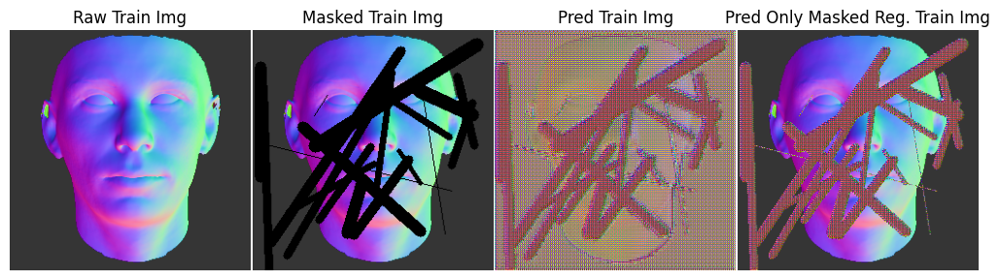

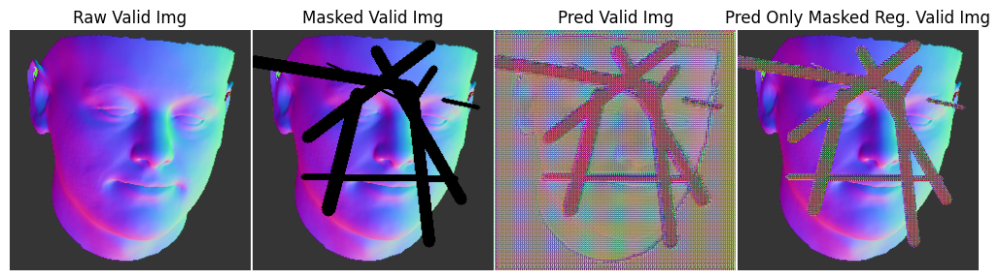

In [24]:
generator_plot_images(generator, 'Train', train_dataset, num = 1)
generator_plot_images(generator, 'Valid', valid_dataset, num = 1)

In [25]:
print("Generator Loss: ", generator_loss(fake_decision, raw_images_examples,pred_images_examples))
print("Generator SSIM: ", generator_ssim(raw_images_examples,pred_images_examples))
print("Generator PSNR: ", generator_psnr(raw_images_examples,pred_images_examples))

Generator Loss:  tf.Tensor(104.678894, shape=(), dtype=float32)
Generator SSIM:  tf.Tensor(0.0042020925, shape=(), dtype=float32)
Generator PSNR:  tf.Tensor(10.724931, shape=(), dtype=float32)


# Training Code Set

### Define Generator and Discriminator training steps for a batch

In [26]:
@tf.function
def train_generator_step(train_raw_images, train_mask_channels, train_masked_images):
    with tf.GradientTape() as gen_tape:
        train_generated_images = generator([train_masked_images, train_mask_channels], training=True)
        train_fake_output = discriminator(train_generated_images, training=False)
        gen_loss = generator_loss(train_fake_output, train_raw_images, train_generated_images)
        gen_ssim = generator_ssim(train_raw_images, train_generated_images)
        gen_psnr = generator_psnr(train_raw_images, train_generated_images)
        
    gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    # generator_optimizer.apply_gradients(zip(gradients, generator.trainable_variables))
    
    return gradients, gen_loss, gen_ssim, gen_psnr

In [27]:
@tf.function
def train_discriminator_step(train_raw_images, train_mask_channels, train_masked_images):
    with tf.GradientTape() as disc_tape:
        train_generated_images = generator([train_masked_images, train_mask_channels], training=False)
        train_real_output = discriminator(train_raw_images, training=True)
        train_fake_output = discriminator(train_generated_images, training=True)
        
        disc_loss = discriminator_loss(train_real_output, train_fake_output)
        disc_acc = discirminator_acc(train_real_output, train_fake_output)

    gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    # discriminator_optimizer.apply_gradients(zip(gradients, discriminator.trainable_variables))
    
    return gradients, disc_loss, disc_acc

### Define a function to train a list of batches

In [28]:
def train_batches(batches_list):
    gen_loss_total = 0
    gen_ssim_total = 0
    gen_psnr_total = 0
    disc_loss_total = 0
    disc_acc_total = 0

    # cumulative gradient
    accumulated_gen_gradients = [tf.zeros_like(var) for var in generator.trainable_variables]
    accumulated_disc_gradients = [tf.zeros_like(var) for var in discriminator.trainable_variables]
    
    for batch in batches_list:
        train_raw_images = batch
        train_mask_channels = mask_irregular(train_raw_images.shape[0], train_raw_images.shape[1], train_raw_images.shape[2])
        train_masked_images = masked_imgs(train_raw_images, train_mask_channels)
        
        gen_gradients, gen_loss, gen_ssim, gen_psnr = train_generator_step(train_raw_images, train_mask_channels, train_masked_images)
        disc_gradients, disc_loss, disc_acc = train_discriminator_step(train_raw_images, train_mask_channels, train_masked_images)

        # cumulative gradient
        for i in range(len(accumulated_gen_gradients)):
            accumulated_gen_gradients[i] += gen_gradients[i]
        for i in range(len(accumulated_disc_gradients)):
            accumulated_disc_gradients[i] += disc_gradients[i]
        
        gen_loss_total += gen_loss.numpy()
        gen_ssim_total += gen_ssim.numpy()
        gen_psnr_total += gen_psnr.numpy()
        disc_loss_total += disc_loss.numpy()
        disc_acc_total += disc_acc.numpy()

    # Applying cumulative gradients
    generator_optimizer.apply_gradients(zip(accumulated_gen_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(accumulated_disc_gradients, discriminator.trainable_variables))
    
    num_batches = len(batches_list)
    return (gen_loss_total / num_batches, gen_ssim_total / num_batches, gen_psnr_total / num_batches,
            disc_loss_total / num_batches, disc_acc_total / num_batches)

### Evaluate the function for the dataset

In [29]:
# Evaluating data from a single batch
@tf.function
def evaluate_batch(raw_images, mask_channels):
    masked_images = masked_imgs(raw_images, mask_channels)
    generated_images = generator([masked_images, mask_channels], training=False)
    real_output = discriminator(raw_images, training=False)
    fake_output = discriminator(generated_images, training=False)

    return {
        'gen_loss': generator_loss(fake_output, raw_images, generated_images),
        'gen_ssim': generator_ssim(raw_images, generated_images),
        'gen_psnr': generator_psnr(raw_images, generated_images),
        'disc_loss': discriminator_loss(real_output, fake_output),
        'disc_acc': discirminator_acc(real_output, fake_output)
    }

# Overall assessment function
def assessment(dataset):
    metrics_sums = {
        'gen_loss': 0,
        'gen_ssim': 0,
        'gen_psnr': 0,
        'disc_loss': 0,
        'disc_acc': 0
    }
    batch_count = 0
    
    for images_batch in dataset:
        batch_metrics = evaluate_batch(images_batch, mask_irregular(images_batch.shape[0], images_batch.shape[1], images_batch.shape[2]))
        batch_count += 1

        for key in metrics_sums:
            metrics_sums[key] += batch_metrics[key].numpy()

    return {key: total / batch_count for key, total in metrics_sums.items()}

### Processing batch data

In [30]:
def process_batches(dataset, batches_list_num):
    train_dataset_batches_list = []
    epoch_metrics = {
        "train_gen_loss": [], "train_gen_ssim": [], "train_gen_psnr": [], 
        "train_disc_loss": [], "train_disc_acc": []
    }

    for i, images_batch in enumerate(dataset):
        train_dataset_batches_list.append(images_batch)
        if (i + 1) % batches_list_num == 0:
            batch_metrics = train_batches(train_dataset_batches_list)
            train_dataset_batches_list = []
            for key, value in zip(epoch_metrics.keys(), batch_metrics):
                    epoch_metrics[key].append(value)

    # Check for unprocessed batch
    if train_dataset_batches_list:
        batch_metrics = train_batches(train_dataset_batches_list)
        train_dataset_batches_list = []
        for key, value in zip(epoch_metrics.keys(), batch_metrics):
                epoch_metrics[key].append(value)

    return epoch_metrics

### Record training information to CSV file

In [31]:
def record_training_info(log_file, current_epoch, metrics_lists, elapsed_time):
    with open(log_file, "a", newline='') as file:
        writer = csv.writer(file)
        if os.stat(log_file).st_size == 0:
            writer.writerow(["Epoch"] + list(metrics_lists.keys()) + ["Elapsed Time (Seconds)"])

        writer.writerow([current_epoch] + [sum(metrics) / len(metrics) for metrics in metrics_lists.values()] + [elapsed_time])

### Print training information

In [32]:
def print_training_info(current_epoch, total_epochs, metrics_lists, elapsed_time, checkpoint_message):
    print(f"Epoch {current_epoch}/{total_epochs}  "
          f"Train[G_Loss:{metrics_lists['train_gen_loss'][-1]:.5f} SSIM:{metrics_lists['train_gen_ssim'][-1] * 100:.2f}% PSNR:{metrics_lists['train_gen_psnr'][-1]:.2f} "
          f"Disc:{metrics_lists['train_disc_loss'][-1]:.5f} {metrics_lists['train_disc_acc'][-1] * 100:.3f}%]  "
          f"Valid[G_Loss:{metrics_lists['valid_gen_loss'][-1]:.5f} SSIM:{metrics_lists['valid_gen_ssim'][-1] * 100:.2f}% PSNR:{metrics_lists['valid_gen_psnr'][-1]:.2f} "
          f"Disc:{metrics_lists['valid_disc_loss'][-1]:.5f} {metrics_lists['valid_disc_acc'][-1] * 100:.3f}%] "
          f"- {elapsed_time:.0f}s  {checkpoint_message}")

### Charting metrics

In [33]:
def plot_metrics(metrics_lists):
    start_epoch = 1
    plot_loss_metric(metrics_lists['train_gen_loss'], metrics_lists['train_gen_ssim'], 
                     metrics_lists['valid_gen_loss'], metrics_lists['valid_gen_ssim'], 
                     'Generator Loss and SSIM', 'SSIM', start=start_epoch)
    plot_loss_metric(metrics_lists['train_gen_loss'], metrics_lists['train_gen_psnr'], 
                     metrics_lists['valid_gen_loss'], metrics_lists['valid_gen_psnr'], 
                     'Generator Loss and PSNR', 'PSNR', start=start_epoch)
    plot_loss_metric(metrics_lists['train_disc_loss'], metrics_lists['train_disc_acc'], 
                     metrics_lists['valid_disc_loss'], metrics_lists['valid_disc_acc'], 
                     'Discriminator Loss and Accuracy', 'Accuracy', start=start_epoch)

In [34]:
def load_metrics_from_csv(log_file):
    metrics_lists = {
        'train_gen_loss': [], 'train_gen_ssim': [], 'train_gen_psnr': [],
        'train_disc_loss': [], 'train_disc_acc': [],
        'valid_gen_loss': [], 'valid_gen_ssim': [], 'valid_gen_psnr': [],
        'valid_disc_loss': [], 'valid_disc_acc': []
    }

    if os.path.exists(log_file) and os.path.getsize(log_file) > 0:
        with open(log_file, "r") as file:
            reader = csv.DictReader(file)
            for row in reader:
                for key in metrics_lists.keys():
                    metrics_lists[key].append(float(row[key]))

    return metrics_lists

### Save checkpoints

In [35]:
checkpoint_dir = './training_checkpoints'
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)
checkpoint_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=1)

### Restore the latest saved checkpoint (if exist)

In [36]:
checkpoint.restore(checkpoint_manager.latest_checkpoint)

### Restoring Training Logs from Previous Sessions

In [37]:
def display_saved_images(epoch, image_path='./saved_images'):
    train_image_path = os.path.join(image_path, f'Train_epoch_{epoch}.png')
    valid_image_path = os.path.join(image_path, f'valid_epoch_{epoch}.png')

    if os.path.exists(train_image_path):
        train_image = mpimg.imread(train_image_path)
        plt.figure(figsize=(12, 9), dpi=300)
        plt.imshow(train_image)
        plt.axis('off')
        plt.show()

    if os.path.exists(valid_image_path):
        valid_image = mpimg.imread(valid_image_path)
        plt.figure(figsize=(12, 9), dpi=300)
        plt.imshow(valid_image)
        plt.axis('off')
        plt.show()

In [38]:
def load_metrics_until_epoch(log_file, epoch):
    metrics_lists = {
        'train_gen_loss': [], 'train_gen_ssim': [], 'train_gen_psnr': [],
        'train_disc_loss': [], 'train_disc_acc': [],
        'valid_gen_loss': [], 'valid_gen_ssim': [], 'valid_gen_psnr': [],
        'valid_disc_loss': [], 'valid_disc_acc': []
    }

    if os.path.exists(log_file) and os.path.getsize(log_file) > 0:
        with open(log_file, "r") as file:
            reader = csv.DictReader(file)
            for row in reader:
                if int(row['Epoch']) <= epoch:
                    for key in metrics_lists.keys():
                        metrics_lists[key].append(float(row[key]))

    return metrics_lists

In [39]:
def read_last_epoch(log_file, total_epochs, epoch_break):
    last_valid_epoch = 0
    cleaned_data = []

    if os.path.exists(log_file) and os.path.getsize(log_file) > 0:
        with open(log_file, "r") as file:
            rows = list(csv.reader(file))
            header = rows[0]
            data_rows = rows[1:]

            # Find a multiple of the last epoch_break
            for row in reversed(data_rows):
                epoch = int(row[0])
                if epoch % epoch_break == 0:
                    last_valid_epoch = epoch
                    cleaned_data = data_rows[:data_rows.index(row) + 1]
                    break

            #  If a matching epoch is found, rewrite the file
            if cleaned_data:
                with open(log_file, "w", newline='') as file:
                    writer = csv.writer(file)
                    writer.writerow(header)
                    writer.writerows(cleaned_data)

            # Reprint previous training information
            for data in cleaned_data:
                current_epoch = int(data[0])
                elapsed_time = float(data[-1])
                metrics_lists = {
                    'train_gen_loss': [float(data[1])],
                    'train_gen_ssim': [float(data[2])],
                    'train_gen_psnr': [float(data[3])],
                    'train_disc_loss': [float(data[4])],
                    'train_disc_acc': [float(data[5])],
                    'valid_gen_loss': [float(data[6])],
                    'valid_gen_ssim': [float(data[7])],
                    'valid_gen_psnr': [float(data[8])],
                    'valid_disc_loss': [float(data[9])],
                    'valid_disc_acc': [float(data[10])]
                }
                print_training_info(current_epoch, total_epochs, metrics_lists, elapsed_time)

                if current_epoch % epoch_break == 0:
                    display_saved_images(current_epoch)
                    plot_metrics(load_metrics_until_epoch(log_file, current_epoch))

    return last_valid_epoch

### Training

In [40]:
class EarlyStopping:
    def __init__(self, monitor='val_loss', patience=100, verbose=False, epoch_break=25):
        self.monitor = monitor
        self.patience = patience
        self.verbose = verbose
        self.epoch_break = epoch_break
        self.best_val = float('inf')
        self.wait = 0
        self.stopped_epoch = 0
        self.should_stop = False  # Whether stopping conditions are met
        self.stop_training = False  # Practical stop training

    def on_epoch_end(self, epoch, current_val):
        if current_val < self.best_val:
            self.best_val = current_val
            self.wait = 0
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.should_stop = True
                if self.verbose:
                    print(f"EarlyStopping: Condition met to stop training at epoch {epoch + 1}")

    def check_stop_training(self, epoch):
        # Check if training stops at multiples of epoch_break
        if self.should_stop and (epoch + 1) % self.epoch_break == 0:
            self.stop_training = True
            if self.verbose:
                print(f"EarlyStopping: Stopping training at epoch {epoch + 1}")

In [41]:
class ModelCheckpoint:
    def __init__(self, checkpoint_manager, gen_filepath, disc_filepath, monitor='val_loss', verbose=False):
        self.checkpoint_manager = checkpoint_manager
        self.gen_filepath = gen_filepath
        self.disc_filepath = disc_filepath
        self.monitor = monitor
        self.verbose = verbose
        self.best_val = float('inf')

    def on_epoch_end(self, epoch, current_val, generator, discriminator):
        message = ""
        if current_val < self.best_val:
            self.best_val = current_val
            generator.save(self.gen_filepath)
            discriminator.save(self.disc_filepath)
            self.checkpoint_manager.save()
            if self.verbose:
                message = f"Checkpoint&Models saved (epoch {epoch + 1})"
        return message

In [42]:
def train(train_dataset, valid_dataset, max_epochs, epoch_break, batches_list_num, generator, discriminator):
    
    log_dir = './saved_logs'
    os.makedirs(log_dir, exist_ok=True)
    log_file = os.path.join(log_dir, "GAN_training_results.csv")
    
    # Read the last completed epoch
    start_epoch = read_last_epoch(log_file, max_epochs, epoch_break)
    
    metrics_lists = {
        'train_gen_loss': [], 'train_gen_ssim': [], 'train_gen_psnr': [],
        'train_disc_loss': [], 'train_disc_acc': [],
        'valid_gen_loss': [], 'valid_gen_ssim': [], 'valid_gen_psnr': [],
        'valid_disc_loss': [], 'valid_disc_acc': []
    }
    

    model_checkpoint = ModelCheckpoint(
        checkpoint_manager=checkpoint_manager,
        gen_filepath='./saved_model/generator_best.h5',
        disc_filepath='./saved_model/discriminator_best.h5',
        monitor='valid_gen_loss', verbose=True
    )

    early_stopper = EarlyStopping(monitor='valid_gen_loss', patience=100, verbose=True, epoch_break=epoch_break) # Early Stopping
        
    for epoch in range(start_epoch, max_epochs):
        start_time = time.time()

        # # For Train
        epoch_metrics = process_batches(train_dataset, batches_list_num)
        for key in epoch_metrics.keys():
            metrics_lists[key].append(sum(epoch_metrics[key]) / len(epoch_metrics[key]))
                    
        # For valid
        valid_metrics = assessment(valid_dataset)
        for key, value in valid_metrics.items():
            metrics_lists['valid_' + key].append(value)
        
        # Save Training Information
        current_epoch = epoch + 1
        elapsed_time = time.time() - start_time
        record_training_info(log_file, current_epoch, metrics_lists, elapsed_time)
        
        # Check and save best model
        current_val = metrics_lists['valid_gen_loss'][-1]
        checkpoint_message = model_checkpoint.on_epoch_end(epoch, current_val, generator, discriminator)

        # Print Training Information
        print_training_info(current_epoch, max_epochs, metrics_lists, elapsed_time, checkpoint_message)
        
        # Checking early stop conditions
        current_val = metrics_lists['valid_gen_loss'][-1]
        early_stopper.on_epoch_end(epoch, current_val)

        # Check if training stops at multiples of epoch_break
        early_stopper.check_stop_training(epoch)
        if early_stopper.stop_training:
            print(f"Early stopping triggered at epoch {epoch + 1}")
            break
        
        # Epoch output results with set intervals
        if (epoch + 1) % epoch_break == 0:
              
            generator_plot_images(generator, 'Train', train_dataset, epoch=current_epoch, save_images=True)
            generator_plot_images(generator, 'Valid', valid_dataset, epoch=current_epoch, save_images=True)

            plot_metrics(load_metrics_from_csv(log_file))

Epoch 1/10000  Train[G_Loss:36.43182 SSIM:10.51% PSNR:11.39 Disc:0.17410 95.694%]  Valid[G_Loss:73.34883 SSIM:7.88% PSNR:11.10 Disc:0.70134 100.000%] - 19s  Checkpoint&Models saved (epoch 1)
Epoch 2/10000  Train[G_Loss:12.49808 SSIM:16.66% PSNR:11.65 Disc:0.00374 100.000%]  Valid[G_Loss:66.50734 SSIM:8.91% PSNR:11.18 Disc:0.11386 99.716%] - 10s  Checkpoint&Models saved (epoch 2)
Epoch 3/10000  Train[G_Loss:9.78641 SSIM:17.30% PSNR:11.67 Disc:0.00595 100.000%]  Valid[G_Loss:40.76293 SSIM:11.79% PSNR:11.43 Disc:1.12025 76.420%] - 10s  Checkpoint&Models saved (epoch 3)
Epoch 4/10000  Train[G_Loss:7.57979 SSIM:17.50% PSNR:11.68 Disc:0.00401 100.000%]  Valid[G_Loss:23.97855 SSIM:13.86% PSNR:11.58 Disc:3.05293 67.045%] - 10s  Checkpoint&Models saved (epoch 4)
Epoch 5/10000  Train[G_Loss:6.50547 SSIM:17.43% PSNR:11.69 Disc:0.00355 100.000%]  Valid[G_Loss:19.89434 SSIM:14.52% PSNR:11.61 Disc:1.91318 65.909%] - 10s  Checkpoint&Models saved (epoch 5)
Epoch 6/10000  Train[G_Loss:5.73745 SSIM:17.3

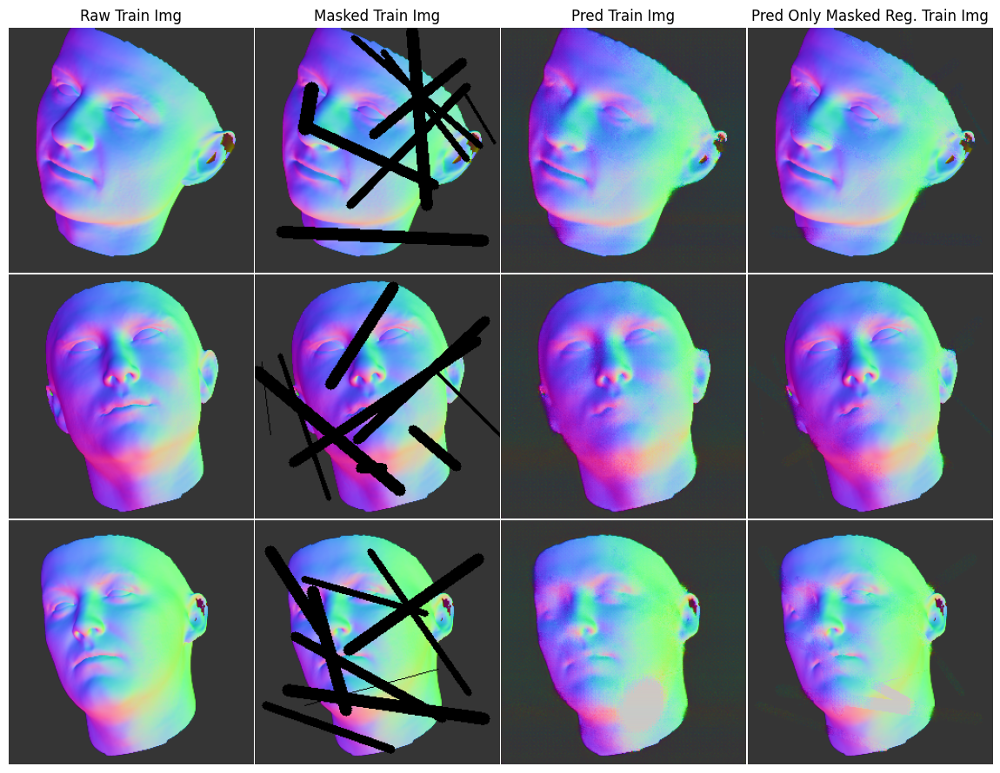

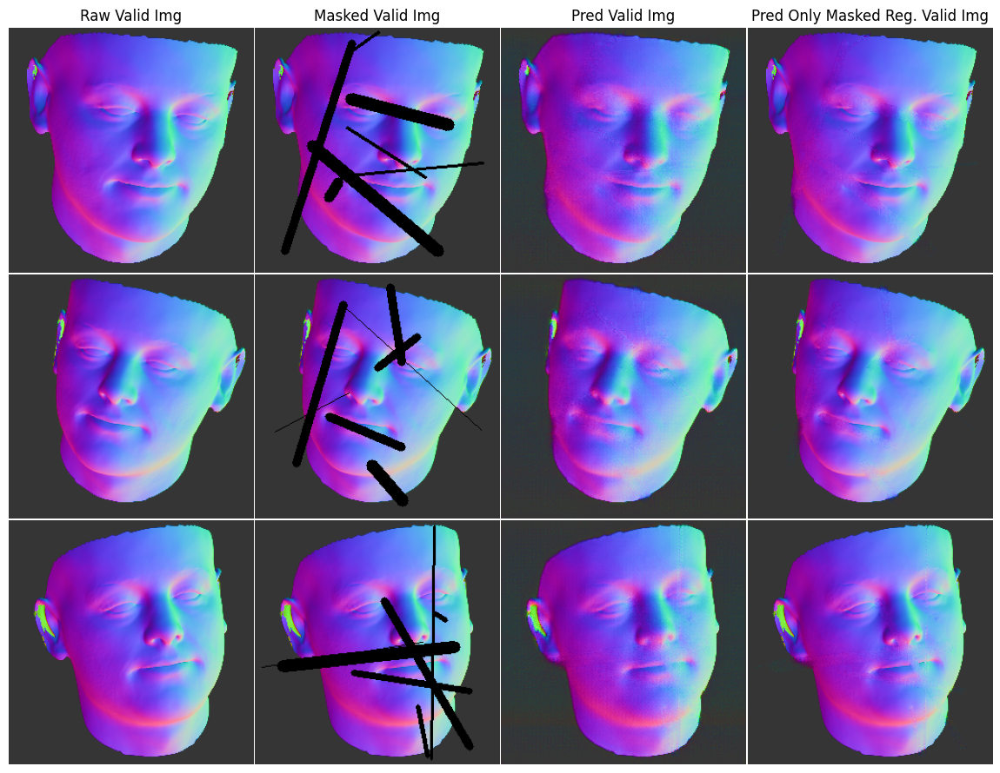

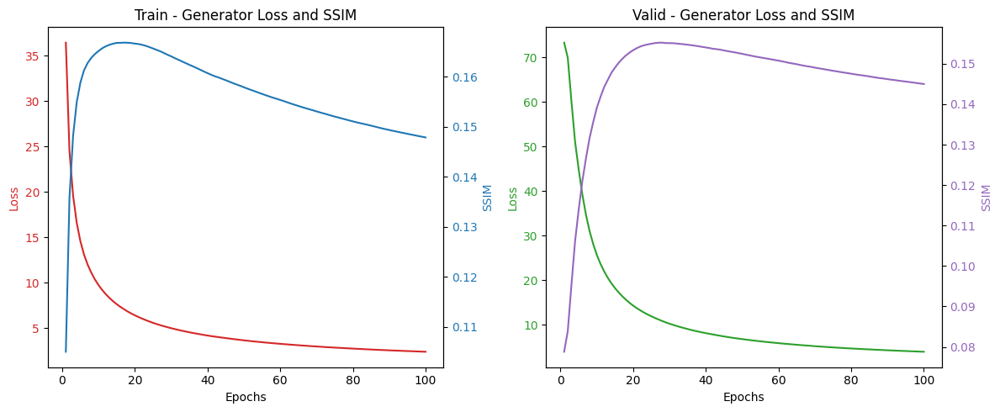

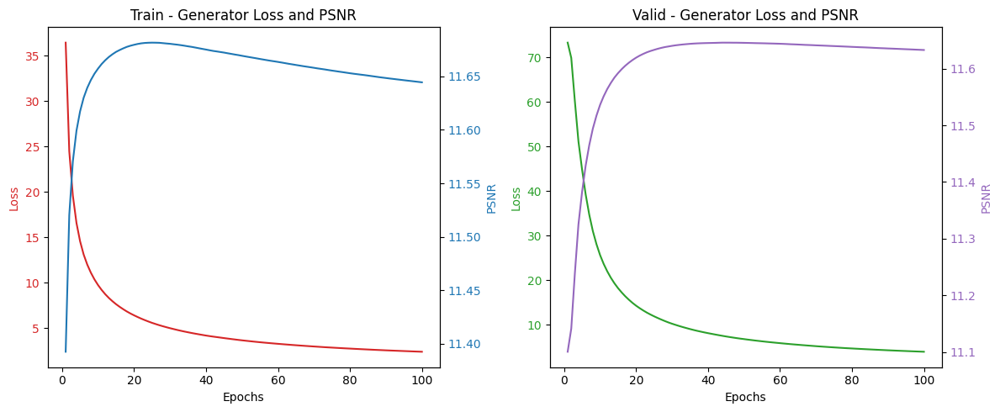

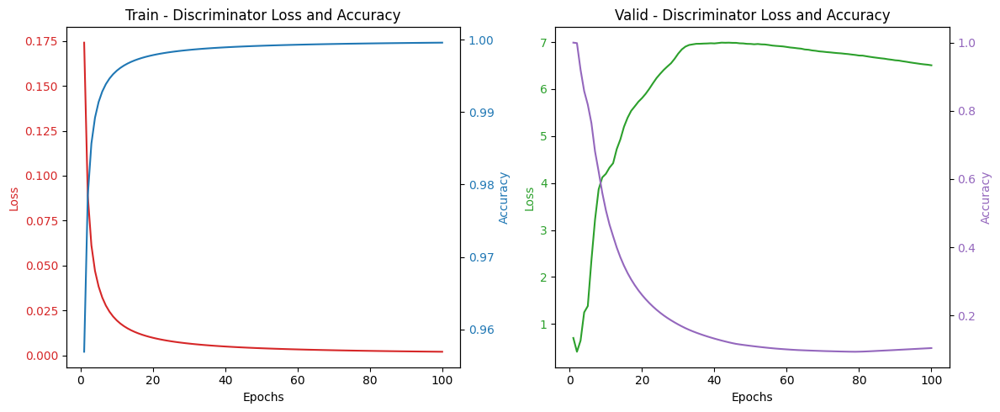

Epoch 101/10000  Train[G_Loss:0.86124 SSIM:13.39% PSNR:11.61 Disc:0.00000 100.000%]  Valid[G_Loss:1.08177 SSIM:13.36% PSNR:11.61 Disc:5.32491 16.193%] - 10s  
Epoch 102/10000  Train[G_Loss:0.91654 SSIM:13.36% PSNR:11.61 Disc:0.00000 100.000%]  Valid[G_Loss:0.90383 SSIM:13.35% PSNR:11.61 Disc:5.22004 16.193%] - 9s  
Epoch 103/10000  Train[G_Loss:0.88367 SSIM:13.37% PSNR:11.61 Disc:0.00000 100.000%]  Valid[G_Loss:1.00437 SSIM:13.34% PSNR:11.60 Disc:5.27401 16.477%] - 10s  
Epoch 104/10000  Train[G_Loss:0.88153 SSIM:13.38% PSNR:11.61 Disc:0.00000 100.000%]  Valid[G_Loss:0.98223 SSIM:13.22% PSNR:11.60 Disc:5.69635 17.614%] - 10s  
Epoch 105/10000  Train[G_Loss:0.98458 SSIM:13.39% PSNR:11.61 Disc:0.00000 100.000%]  Valid[G_Loss:0.99773 SSIM:13.35% PSNR:11.61 Disc:5.26013 17.614%] - 10s  
Epoch 106/10000  Train[G_Loss:0.86508 SSIM:13.45% PSNR:11.61 Disc:0.00000 100.000%]  Valid[G_Loss:0.92003 SSIM:13.42% PSNR:11.61 Disc:5.12998 18.182%] - 10s  
Epoch 107/10000  Train[G_Loss:0.97629 SSIM:13.3

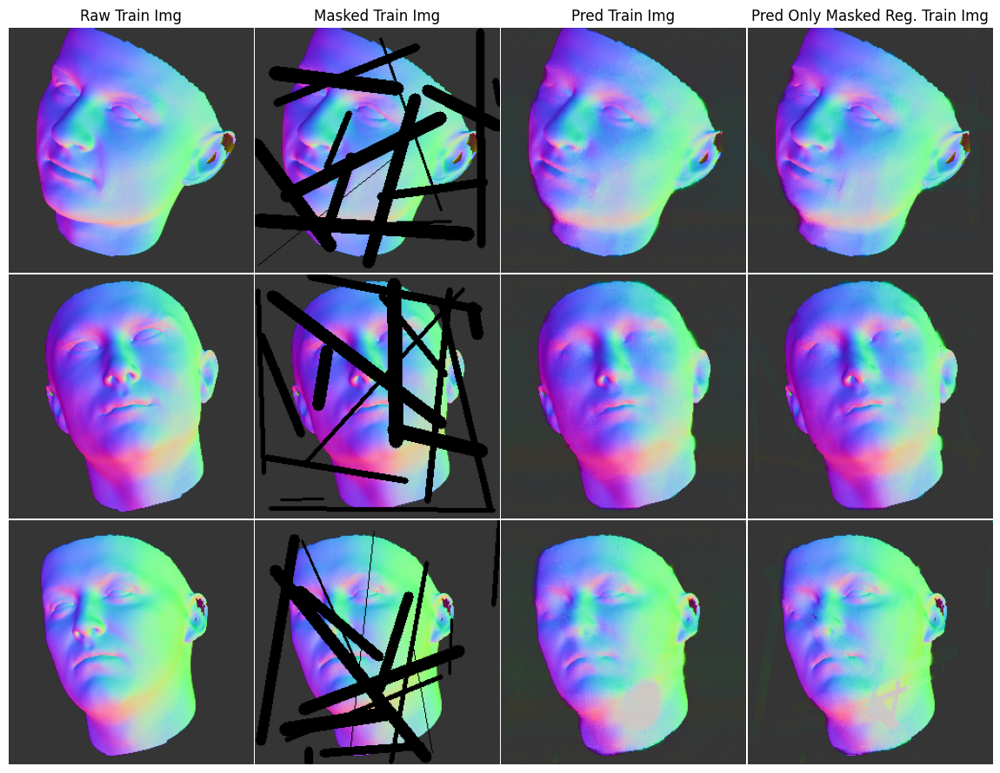

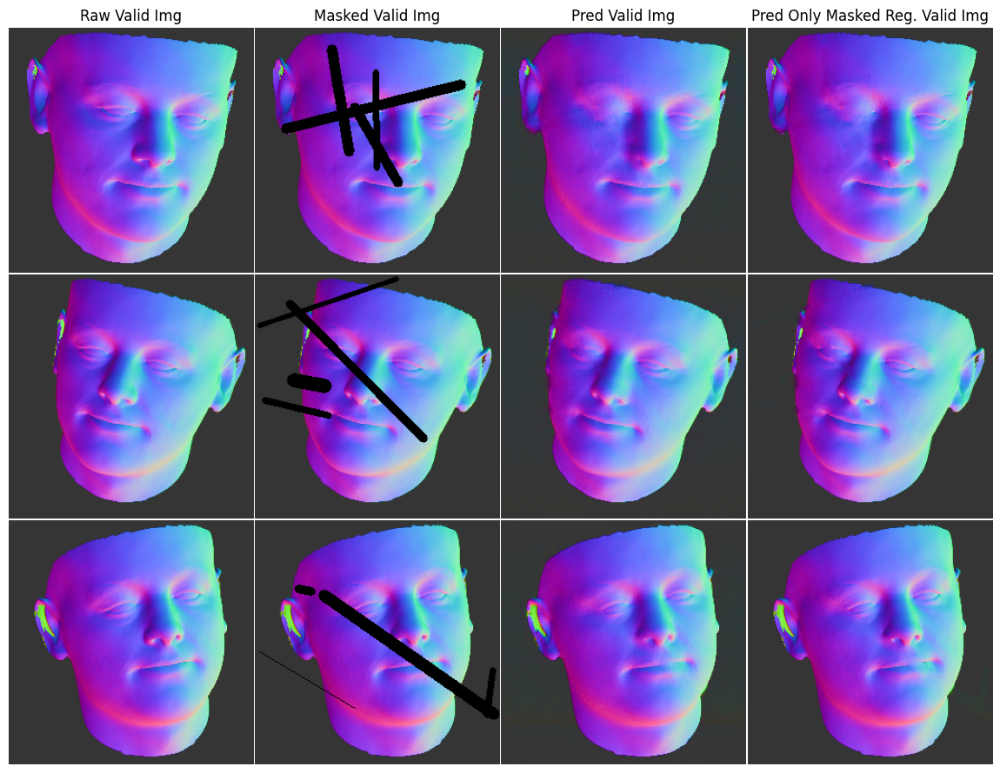

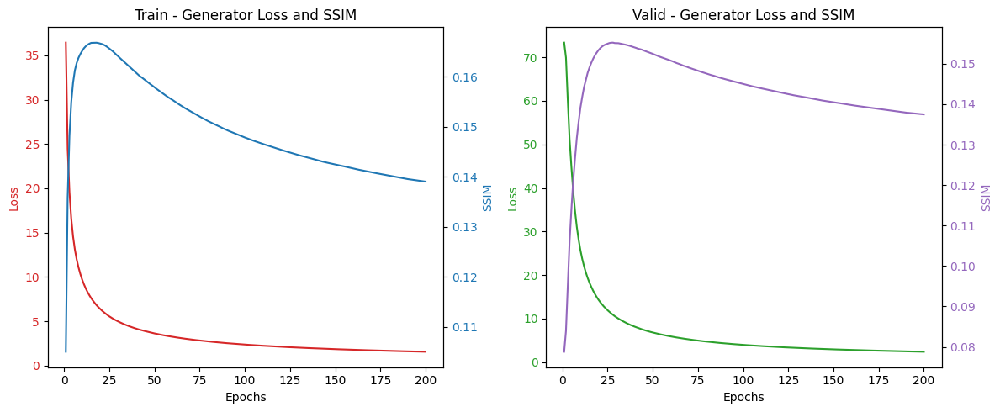

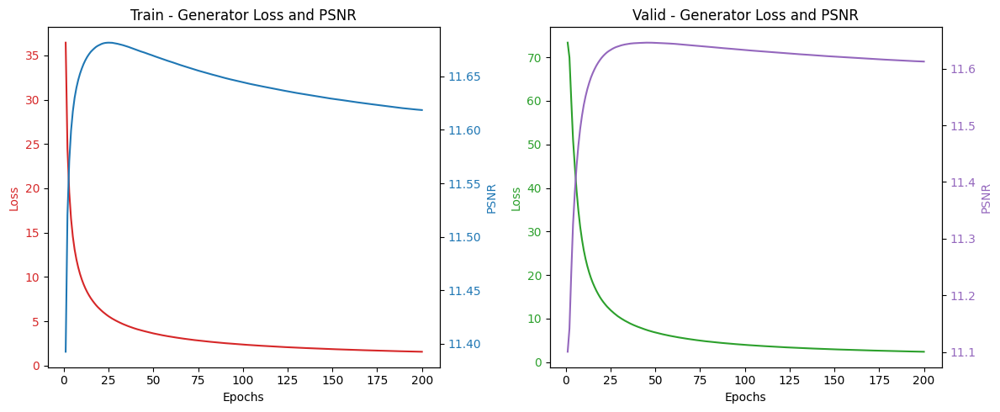

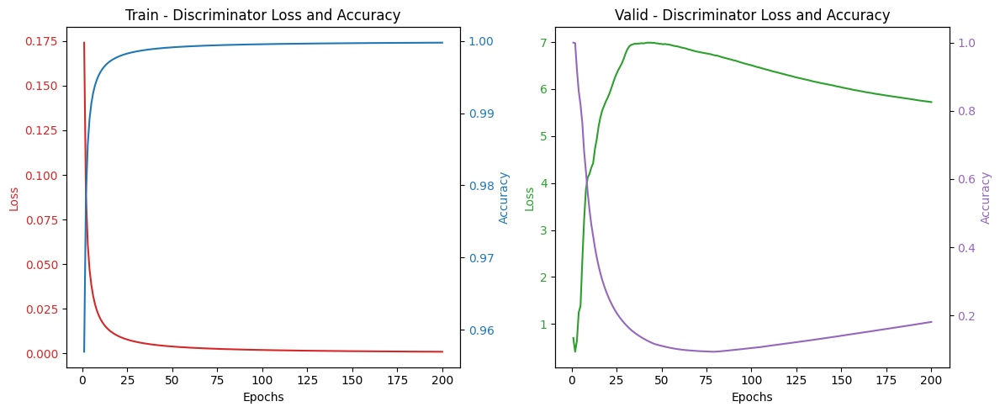

Epoch 201/10000  Train[G_Loss:0.61870 SSIM:12.89% PSNR:11.59 Disc:0.00000 100.000%]  Valid[G_Loss:0.64981 SSIM:12.73% PSNR:11.59 Disc:5.02517 34.659%] - 10s  
Epoch 202/10000  Train[G_Loss:0.61997 SSIM:12.73% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.64306 SSIM:12.79% PSNR:11.59 Disc:4.81311 34.659%] - 10s  
Epoch 203/10000  Train[G_Loss:0.62958 SSIM:12.67% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.51971 SSIM:12.66% PSNR:11.58 Disc:4.74095 34.375%] - 10s  Checkpoint&Models saved (epoch 203)
Epoch 204/10000  Train[G_Loss:0.66578 SSIM:12.64% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.60520 SSIM:12.72% PSNR:11.58 Disc:4.83814 34.659%] - 10s  
Epoch 205/10000  Train[G_Loss:0.62901 SSIM:12.63% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.75612 SSIM:12.64% PSNR:11.58 Disc:5.03610 34.659%] - 10s  
Epoch 206/10000  Train[G_Loss:0.66784 SSIM:12.67% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.78900 SSIM:12.64% PSNR:11.58 Disc:4.80648 34.659%] - 10s  
Epoch 207/1

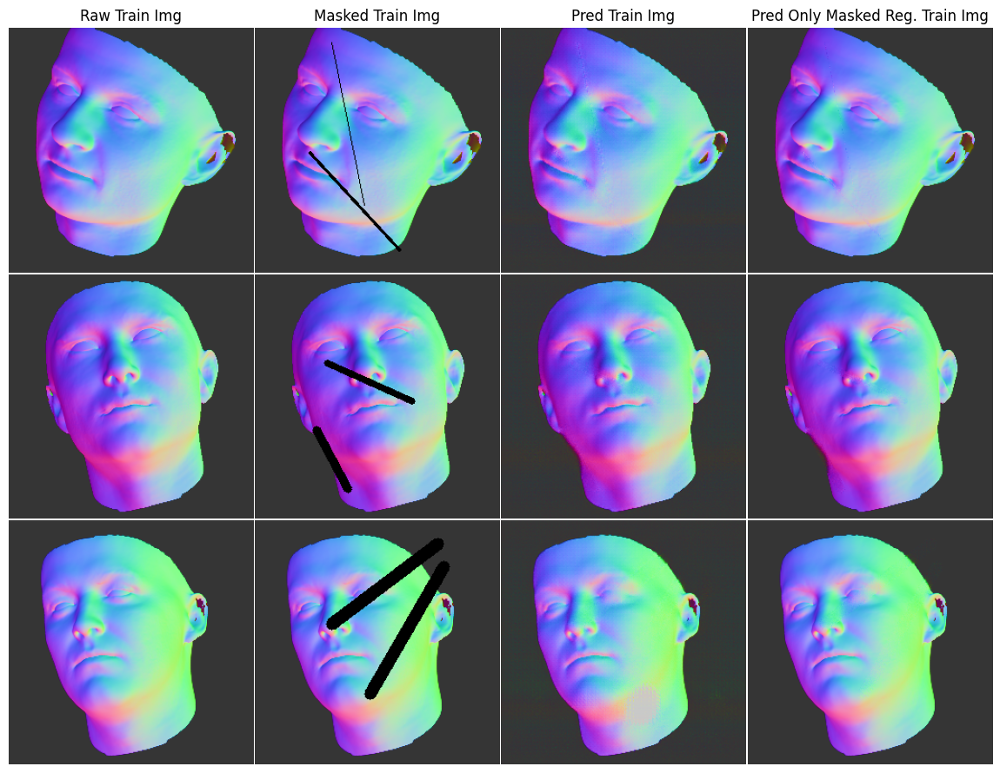

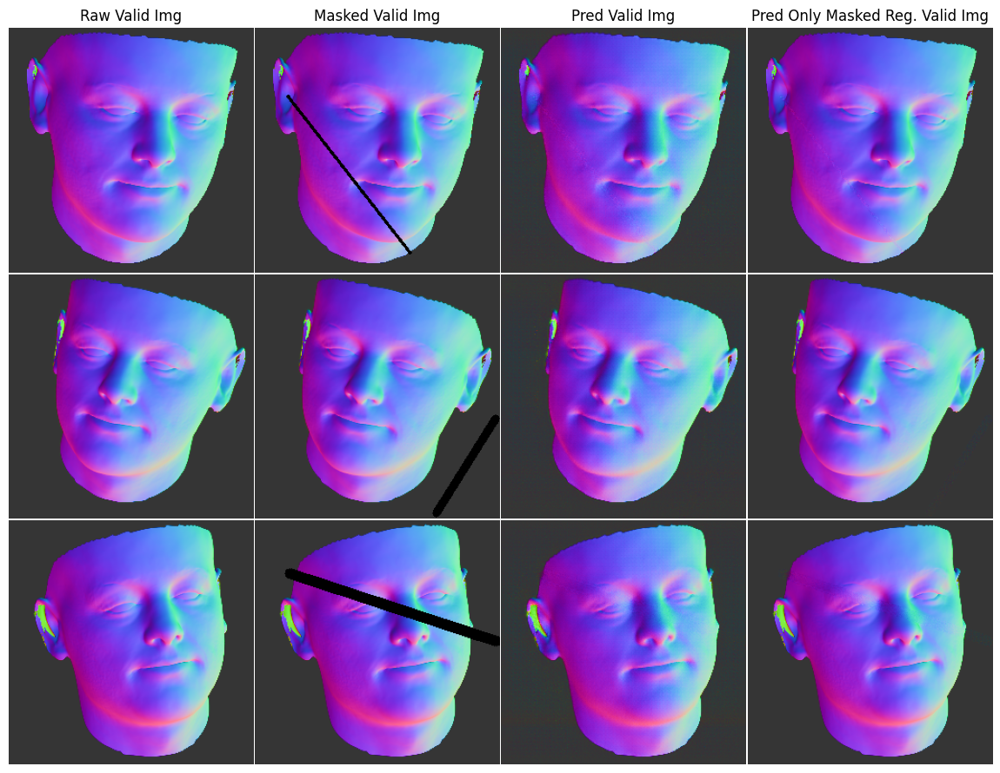

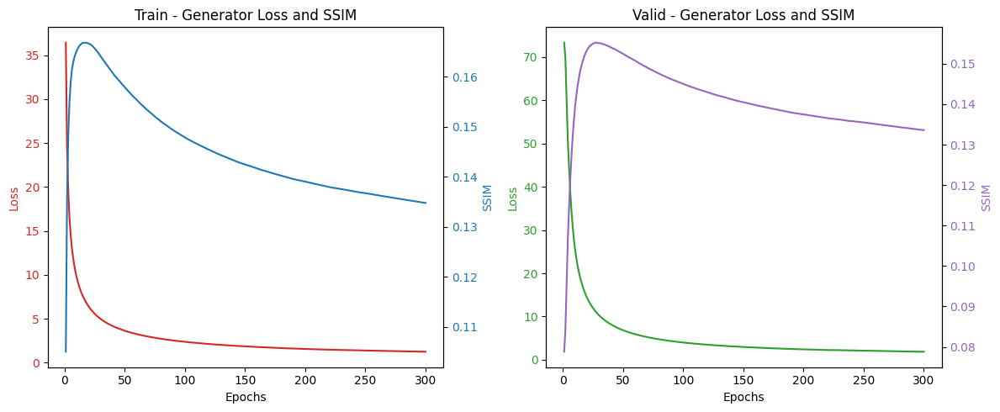

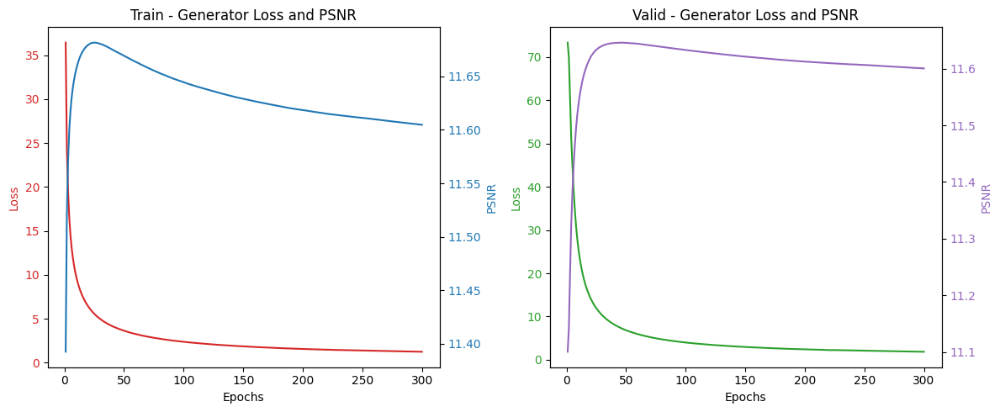

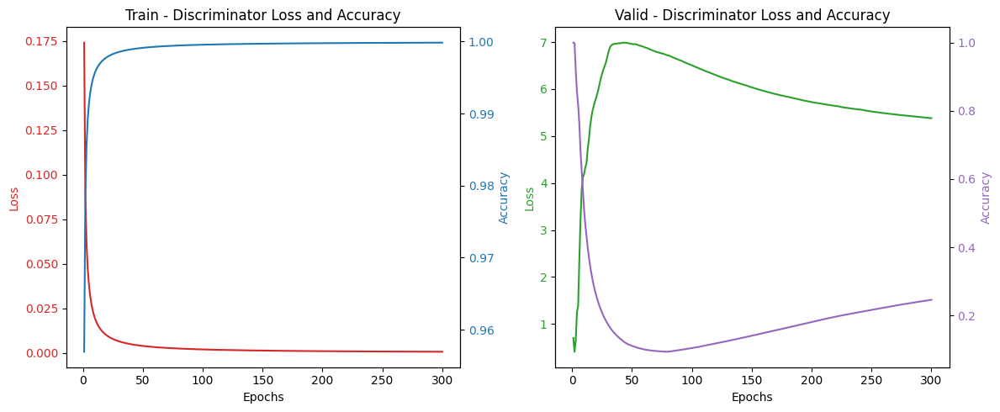

Epoch 301/10000  Train[G_Loss:0.50119 SSIM:12.43% PSNR:11.57 Disc:0.00000 100.000%]  Valid[G_Loss:0.59764 SSIM:12.37% PSNR:11.57 Disc:4.90741 40.341%] - 10s  
Epoch 302/10000  Train[G_Loss:0.51027 SSIM:12.43% PSNR:11.57 Disc:0.00000 100.000%]  Valid[G_Loss:0.65978 SSIM:12.29% PSNR:11.56 Disc:4.67517 40.341%] - 10s  
Epoch 303/10000  Train[G_Loss:0.49433 SSIM:12.40% PSNR:11.57 Disc:0.00000 100.000%]  Valid[G_Loss:0.62827 SSIM:12.31% PSNR:11.57 Disc:4.72678 40.341%] - 10s  
Epoch 304/10000  Train[G_Loss:0.49296 SSIM:12.35% PSNR:11.57 Disc:0.00000 100.000%]  Valid[G_Loss:0.63594 SSIM:12.28% PSNR:11.56 Disc:4.79947 40.341%] - 10s  
Epoch 305/10000  Train[G_Loss:0.50020 SSIM:12.33% PSNR:11.57 Disc:0.00000 100.000%]  Valid[G_Loss:0.66995 SSIM:12.26% PSNR:11.56 Disc:4.62639 40.341%] - 10s  
Epoch 306/10000  Train[G_Loss:0.50000 SSIM:12.35% PSNR:11.57 Disc:0.00000 100.000%]  Valid[G_Loss:0.38227 SSIM:12.28% PSNR:11.57 Disc:4.88703 40.341%] - 10s  Checkpoint&Models saved (epoch 306)
Epoch 307/1

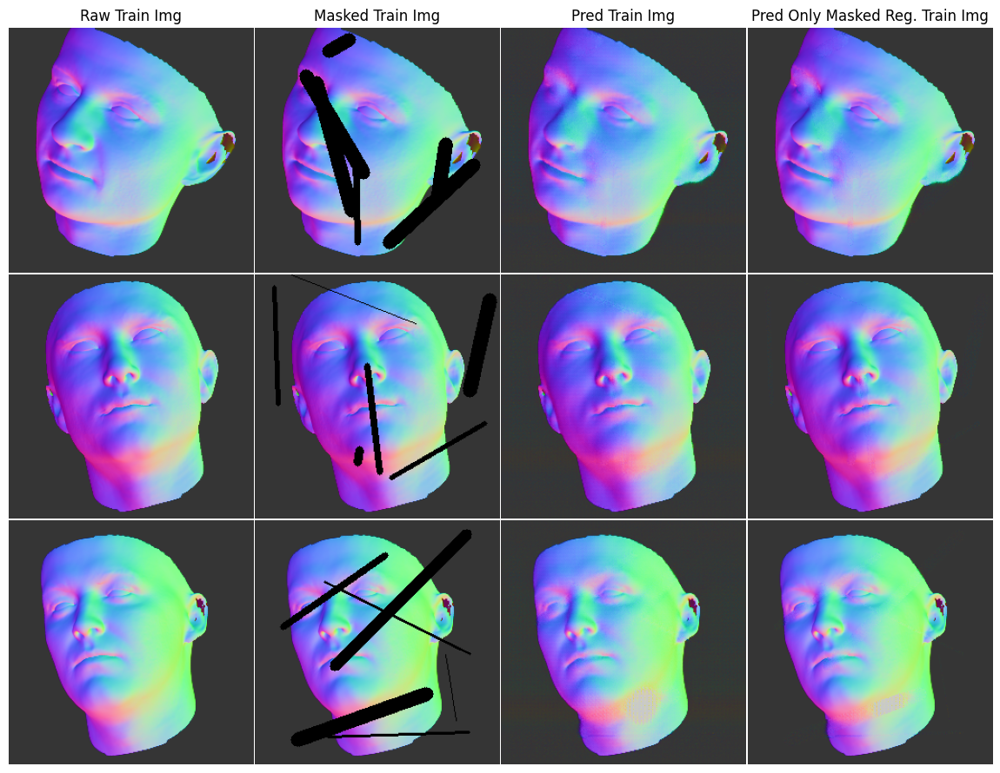

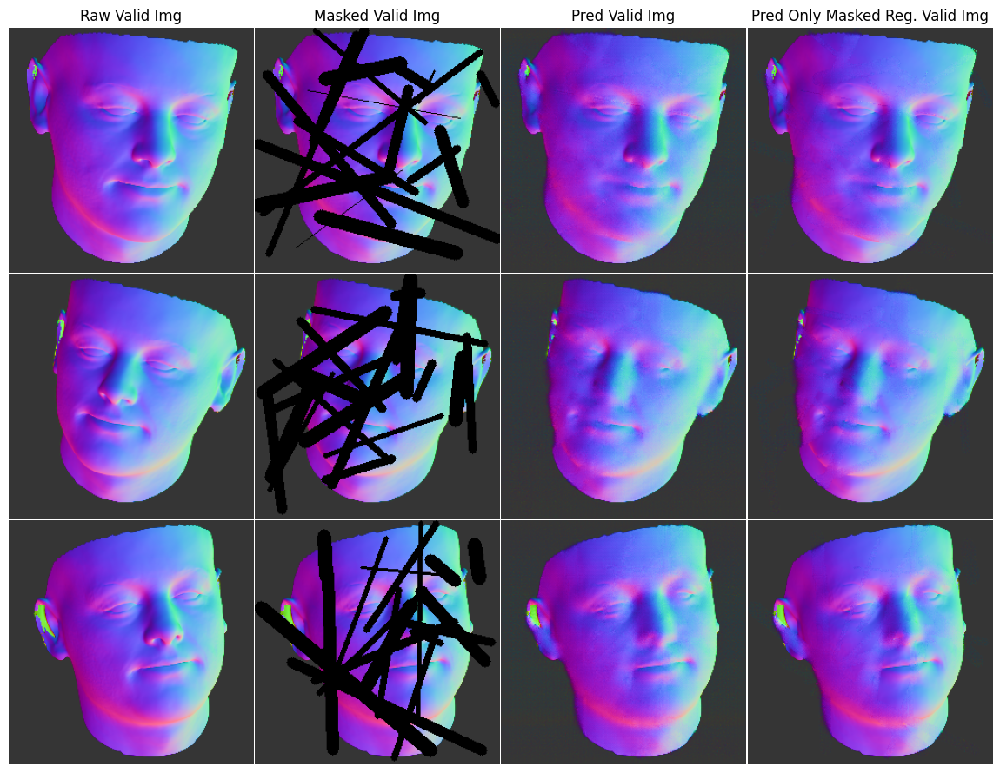

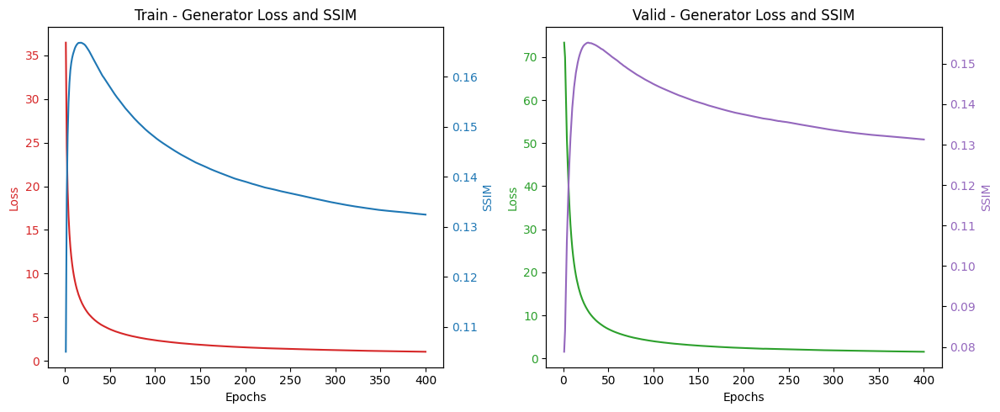

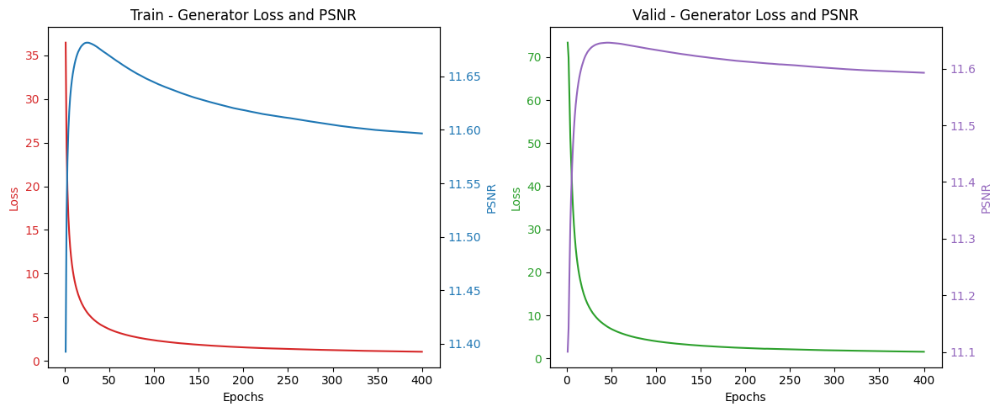

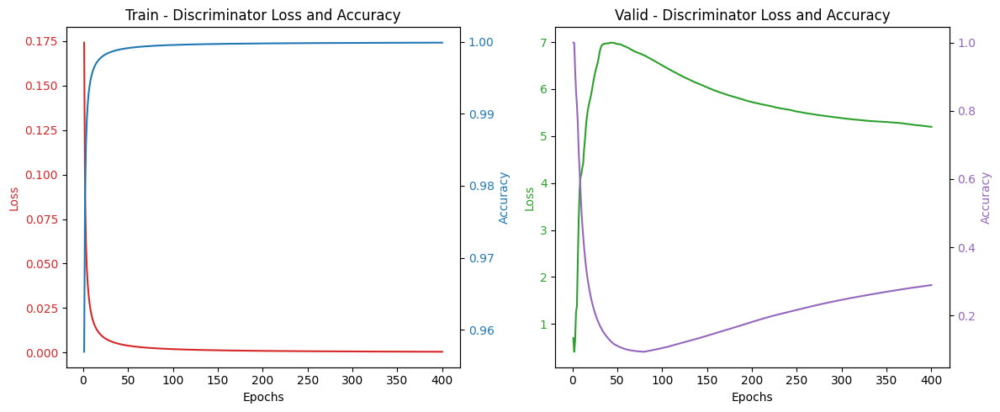

Epoch 401/10000  Train[G_Loss:0.46677 SSIM:12.62% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.47982 SSIM:12.51% PSNR:11.57 Disc:4.24730 43.182%] - 10s  
Epoch 402/10000  Train[G_Loss:0.49695 SSIM:12.65% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.54090 SSIM:12.64% PSNR:11.58 Disc:4.50441 43.182%] - 10s  
Epoch 403/10000  Train[G_Loss:0.47322 SSIM:12.72% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.65847 SSIM:12.67% PSNR:11.58 Disc:4.42808 43.182%] - 10s  
Epoch 404/10000  Train[G_Loss:0.52142 SSIM:12.69% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.58223 SSIM:12.52% PSNR:11.57 Disc:3.75972 43.182%] - 10s  
Epoch 405/10000  Train[G_Loss:0.51575 SSIM:12.61% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.69285 SSIM:12.62% PSNR:11.58 Disc:4.24451 43.182%] - 10s  
Epoch 406/10000  Train[G_Loss:0.55707 SSIM:12.69% PSNR:11.58 Disc:0.00000 100.000%]  Valid[G_Loss:0.69602 SSIM:12.44% PSNR:11.57 Disc:4.18337 43.182%] - 10s  
EarlyStopping: Condition met to stop training 

In [43]:
train(train_dataset, valid_dataset, max_epochs=10000, epoch_break=100, batches_list_num=10, generator=generator, discriminator=discriminator)

# Testing and Evaluation on Test Dataset

### Load trained generator

In [43]:
BATCH_SIZE = 16
test_dir = '../dataset/test/'
test_files = glob.glob(test_dir + '*_normal_*.png')
def preprocess(images):
    images = tf.image.resize(images, [256, 256])
    images = tf.cast(images, tf.float32)
    images = (images - 127.5) / 127.5 # [-1, 1]
    return images

def load_and_preprocess_image(file_path):
    # print("file_path", file_path)
    # Load the image from file
    image = tf.io.read_file(file_path)
    # Decode the image to a tensor
    image = tf.image.decode_jpeg(image, channels=3)
    # Preprocess the image
    image = preprocess(image)
    return image

def normalise(images):
    images,images_norm = tf.linalg.normalize(images, axis=2) #Normalise the input data
    return images

test_dataset = tf.data.Dataset.from_tensor_slices(test_files)
test_dataset = test_dataset.map(load_and_preprocess_image)
test_dataset = test_dataset.map(normalise)
print("Test dataset size:", len(test_files))
test_dataset = test_dataset.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
print("Total number of batches in test dataset:", len(list(test_dataset)))
print("Test dataset: ", tf.data.DatasetSpec.from_value(test_dataset))

Test dataset size: 162
Total number of batches in test dataset: 11
Test dataset:  DatasetSpec(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorShape([]))


In [44]:
gen_model_pth = './saved_model/generator_best.h5'
if os.path.exists(gen_model_pth):
    print('Load generator model')
    generator = tf.keras.models.load_model(gen_model_pth, custom_objects={'UnitNormalize': UnitNormalize})
    
dis_model_pth = './saved_model/discriminator_best.h5'
if os.path.exists(dis_model_pth):
    print('Load discriminator model')
    discriminator = tf.keras.models.load_model(dis_model_pth, compile=False)

Load generator model
Load discriminator model


### Generate Irregular Mask (batch size) （generate fixed masking lines for testing）

In [45]:
def mask_irregular(batch_size, mask_width, mask_height, seed=23):
    random.seed(seed)
    np.random.seed(seed)
    
    size = int(round((mask_width + mask_height) * 0.03))
    mask = np.zeros((batch_size, mask_width, mask_height, 1))
    
    num_lines = np.random.randint(1, 20)
    x1, x2 = np.random.randint(1, mask_width, num_lines), np.random.randint(1, mask_width, num_lines)
    y1, y2 = np.random.randint(1, mask_height, num_lines), np.random.randint(1, mask_height, num_lines)
    thickness = np.random.randint(1, size, num_lines)
    
    for i in range(batch_size):
        for j in range(num_lines):
            cv2.line(mask[i], (x1[j], y1[j]), (x2[j], y2[j]), (1,), thickness[j])

    return np.float32(((1 - mask) * 2) - 1) # [-1, 1]

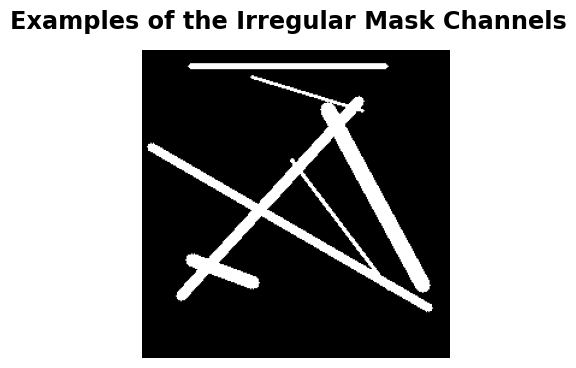

In [46]:
irregular_mask_examples = mask_irregular(6, 256, 256)
for ax, img in zip(ImageGrid(plt.figure(figsize=(6, 4)), 111, nrows_ncols=(1, 1), axes_pad=0.3), 
                   irregular_mask_examples):
    ax.imshow((img+1)/2, cmap='binary')
    ax.axis('off')
plt.suptitle('Examples of the Irregular Mask Channels', fontsize='xx-large',fontweight='heavy')
plt.show()

### Evaluate the function for the dataset

In [47]:
def generator_cosine_similarity_loss(real_images, generated_images):
    # Cosine similarity is maximized, so we negate the value to minimize loss
    return cosine_loss(real_images, generated_images)

In [48]:
# Evaluating data from a single batch
@tf.function
def evaluate_batch(raw_images, mask_channels):
    masked_images = masked_imgs(raw_images, mask_channels)
    generated_images = generator([masked_images, mask_channels], training=False)
    real_output = discriminator(raw_images, training=False)
    fake_output = discriminator(generated_images, training=False)

    return {
        'gen_loss': generator_cosine_similarity_loss(raw_images, generated_images),
        'gen_ssim': generator_ssim(raw_images, generated_images),
        'gen_psnr': generator_psnr(raw_images, generated_images),
        'disc_loss': discriminator_loss(real_output, fake_output),
        'disc_acc': discirminator_acc(real_output, fake_output)
    }

# Overall assessment function
def assessment(dataset):
    metrics_sums = {
        'gen_loss': 0,
        'gen_ssim': 0,
        'gen_psnr': 0,
        'disc_loss': 0,
        'disc_acc': 0
    }
    batch_count = 0
    
    for images_batch in dataset:
        batch_metrics = evaluate_batch(images_batch, mask_irregular(images_batch.shape[0], images_batch.shape[1], images_batch.shape[2]))
        batch_count += 1

        for key in metrics_sums:
            metrics_sums[key] += batch_metrics[key].numpy()

    return {key: total / batch_count for key, total in metrics_sums.items()}

In [49]:
test_metrics = assessment(test_dataset)

print("Test dataset Avg LOSS: {:.4f}\n"
      "Test dataset Avg SSIM: {:.4f}\n"
      "Test dataset Avg PSNR: {:.4f}\n"
      "Test dataset Disc Avg Loss: {:.4f}\n"
      "Test dataset Disc Avg ACC: {:.2f}%".format(test_metrics['gen_loss'], 
                                                  test_metrics['gen_ssim'], 
                                                  test_metrics['gen_psnr'], 
                                                  test_metrics['disc_loss'], 
                                                  test_metrics['disc_acc'] * 100))

Test dataset Avg LOSS: -0.9958
Test dataset Avg SSIM: 0.1238
Test dataset Avg PSNR: 11.5672
Test dataset Disc Avg Loss: 4.9183
Test dataset Disc Avg ACC: 37.50%


In [50]:
print('Pred time for a batch')
for images_batch in test_dataset.take(1):
    test_raw_images = images_batch
    test_mask_channels = mask_irregular(test_raw_images.shape[0], test_raw_images.shape[1], test_raw_images.shape[2])
    test_masked_images = masked_imgs(test_raw_images, test_mask_channels)
    test_pred_images = generator.predict([test_masked_images, test_mask_channels], batch_size=BATCH_SIZE)

Pred time for a batch
1/1 [==============================] - 0s 233ms/step


### Plot Function

In [51]:
def generator_plot_images(gen_model, text, dataset, num=3, batch_num=0, start_img=0, end_img=None, save_path='./saved_images', epoch=0, save_images=False, dpi=300):
    os.makedirs(save_path, exist_ok=True)

    # 选择指定的batch
    for batch_idx, images_batch in enumerate(dataset):
        if batch_idx == batch_num:
            raw_images = images_batch
            # 如果没有指定end_img，则显示从start_img开始的num张图像
            end_img = end_img or start_img + num
            # 确保索引不超出范围
            end_img = min(end_img, raw_images.shape[0])
            mask_channels = mask_irregular(raw_images.shape[0], raw_images.shape[1], raw_images.shape[2])
            masked_images = masked_imgs(raw_images, mask_channels)
            pred_images = gen_model([masked_images, mask_channels], training=False)
            pred_images, pred_norm = tf.linalg.normalize(pred_images, axis=3)

            masked_region_pred_images = only_masked_region_pred_imgs(mask_channels, masked_images, pred_images)

            # 调整图像网格大小以适应选定的图像数量
            grid = ImageGrid(plt.figure(figsize=(12, (end_img - start_img) * 3), dpi=dpi), 111, nrows_ncols=((end_img - start_img), 4))

            # 仅处理指定范围内的图像
            for i in range(start_img, end_img):
                ax_idx = i - start_img

                ax = grid[ax_idx * 4]
                ax.imshow((raw_images[i] + 1) / 2)
                ax.axis('off')
                if ax_idx == 0:
                    ax.set_title('Raw {} Img'.format(text), fontsize =15)

                ax = grid[ax_idx * 4 + 1]
                ax.imshow((masked_images[i] + 1) / 2)
                ax.axis('off')
                if ax_idx == 0:
                    ax.set_title('Masked {} Img'.format(text), fontsize =15)

                ax = grid[ax_idx * 4 + 2]
                ax.imshow((pred_images[i] + 1) / 2)
                ax.axis('off')
                if ax_idx == 0:
                    ax.set_title('Pred {} Img'.format(text), fontsize =15)

                ax = grid[ax_idx * 4 + 3]
                ax.imshow((masked_region_pred_images[i] + 1) / 2)
                ax.axis('off')
                if ax_idx == 0:
                    ax.set_title('Pred Only Masked Reg.'.format(text),  fontsize =15)

            plt.tight_layout()
            if save_images:
                image_save_path = os.path.join(save_path, f'{text}_epoch_{epoch}.png')
                plt.savefig(image_save_path, dpi=dpi)
            plt.show()

            # 一旦找到并处理了指定的batch，就跳出循环
            break


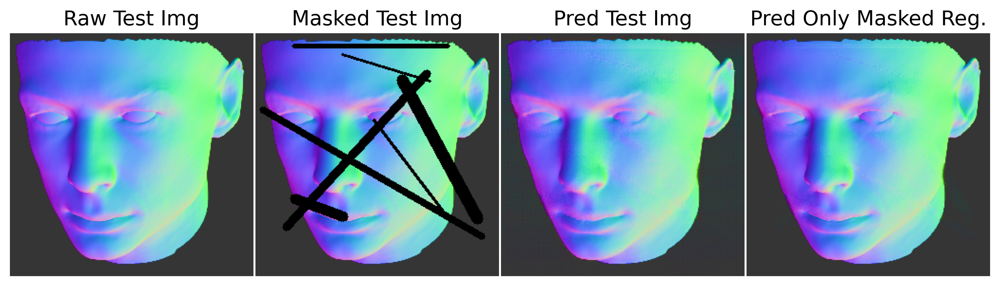

In [52]:
generator_plot_images(generator, 'Test', test_dataset, batch_num=3, start_img=6, end_img=7, epoch='final', save_images=True)

### Reading and plotting data from log data file

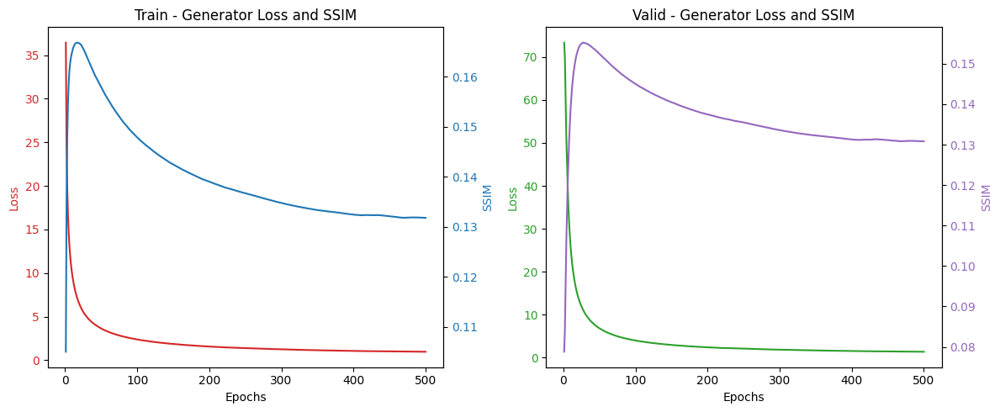

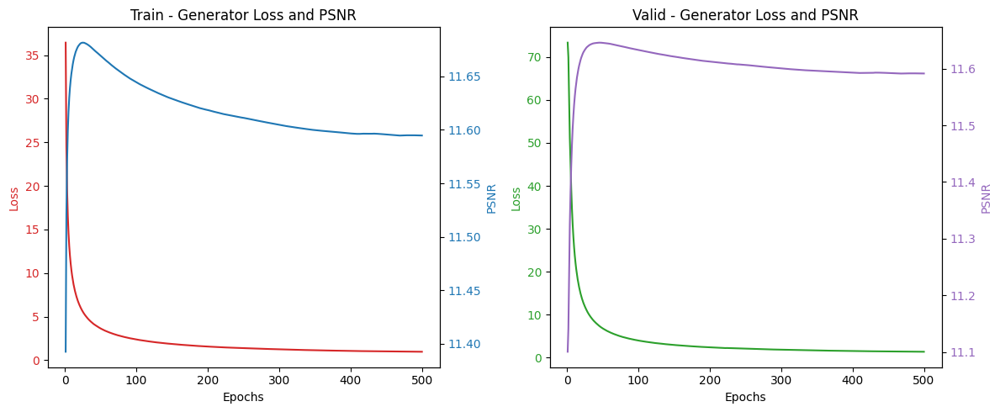

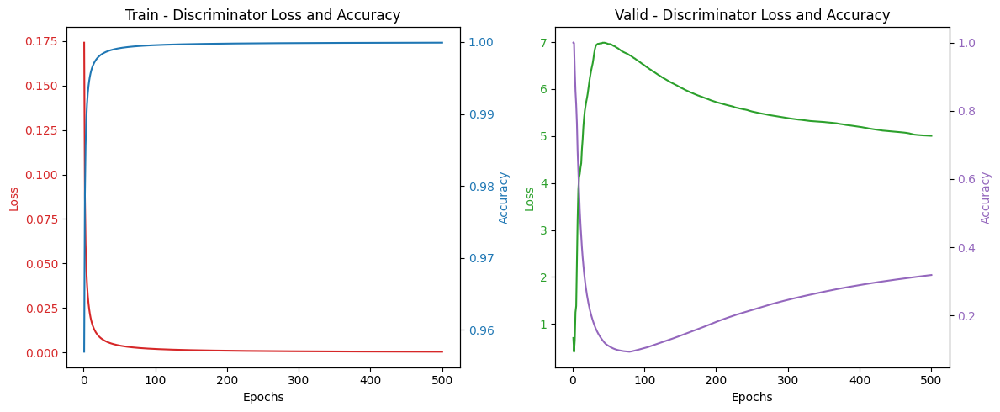

In [53]:
log_dir = './saved_logs'
os.makedirs(log_dir, exist_ok=True)
log_file = os.path.join(log_dir, "GAN_training_results.csv")
plot_metrics(load_metrics_from_csv(log_file))

In [54]:
def plot_loss_metric(train_loss, train_metric, test_loss, test_metric, title, metric, start=0):
    x_values = range(start, start + len(train_loss))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Plotting the training set
    ax_train_loss = ax1
    ax_train_metric = ax1.twinx()
    ax_train_loss.plot(x_values, train_loss, color='tab:red')
    ax_train_metric.plot(x_values, train_metric, color='tab:blue')

    ax_train_loss.set_xlabel('Epochs')
    ax_train_loss.set_ylabel('Loss', color='tab:red')
    ax_train_metric.set_ylabel(metric, color='tab:blue')

    ax_train_loss.tick_params(axis='y', labelcolor='tab:red')
    ax_train_metric.tick_params(axis='y', labelcolor='tab:blue')

    ax1.set_title('U-Net (Train - ' + title +')', fontsize=14)

    # Plotting the test set
    ax_test_loss = ax2
    ax_test_metric = ax2.twinx()
    ax_test_loss.plot(x_values, test_loss, color='tab:green')
    ax_test_metric.plot(x_values, test_metric, color='tab:purple')

    ax_test_loss.set_xlabel('Epochs')
    ax_test_loss.set_ylabel('Loss', color='tab:green')
    ax_test_metric.set_ylabel(metric, color='tab:purple')

    ax_test_loss.tick_params(axis='y', labelcolor='tab:green')
    ax_test_metric.tick_params(axis='y', labelcolor='tab:purple')

    ax2.set_title('U-Net (Valid - ' + title +')', fontsize=14)

    plt.tight_layout()
    plt.savefig("./saved_images/filename.png", dpi=300)
    plt.show()

In [55]:
def plot_metrics(metrics_lists):
    start_epoch = 1
    plot_loss_metric(metrics_lists['train_gen_loss'], metrics_lists['train_gen_ssim'], 
                     metrics_lists['valid_gen_loss'], metrics_lists['valid_gen_ssim'], 
                     'Generator Loss and SSIM', 'SSIM', start=start_epoch)
    plot_loss_metric(metrics_lists['train_gen_loss'], metrics_lists['train_gen_psnr'], 
                     metrics_lists['valid_gen_loss'], metrics_lists['valid_gen_psnr'], 
                     'Generator Loss and PSNR', 'PSNR', start=start_epoch)
    plot_loss_metric(metrics_lists['train_disc_loss'], metrics_lists['train_disc_acc'], 
                     metrics_lists['valid_disc_loss'], metrics_lists['valid_disc_acc'], 
                     'Discriminator Loss and Accuracy', 'Accuracy', start=start_epoch)

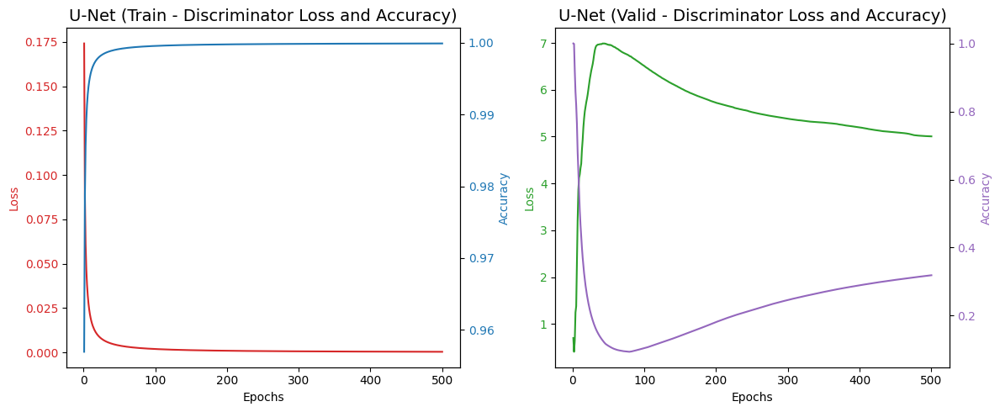

In [56]:
log_dir = './saved_logs'
os.makedirs(log_dir, exist_ok=True)
log_file = os.path.join(log_dir, "GAN_training_results.csv")
metrics_lists = load_metrics_from_csv(log_file)
start_epoch = 1
plot_loss_metric(metrics_lists['train_disc_loss'], metrics_lists['train_disc_acc'], 
                 metrics_lists['valid_disc_loss'], metrics_lists['valid_disc_acc'], 
                 'Discriminator Loss and Accuracy', 'Accuracy', start=start_epoch)

In [57]:
def load_metrics_from_csv_with_time(log_file):
    metrics_lists = {'elapsed_time': []
    }
    total_elapsed_time = 0

    if os.path.exists(log_file) and os.path.getsize(log_file) > 0:
        with open(log_file, "r") as file:
            reader = csv.DictReader(file)
            for row in reader:
                for key in metrics_lists.keys():
                    if key == 'elapsed_time':
                        elapsed_time = float(row['Elapsed Time (Seconds)'])
                        metrics_lists[key].append(elapsed_time)
                        total_elapsed_time += elapsed_time
                    else:
                        metrics_lists[key].append(float(row[key]))

    return metrics_lists, total_elapsed_time

metrics, total_time = load_metrics_from_csv_with_time(log_file)
print("Total Training Time: ", total_time, "seconds")


import time

print('Pred time for the entire test dataset')

start_time = time.time()

for images_batch in test_dataset:
    test_raw_images = images_batch
    test_mask_channels = mask_irregular(test_raw_images.shape[0], test_raw_images.shape[1], test_raw_images.shape[2])
    test_masked_images = masked_imgs(test_raw_images, test_mask_channels)
    test_pred_images = generator.predict([test_masked_images, test_mask_channels], batch_size=BATCH_SIZE)

end_time = time.time()

total_time = end_time - start_time
print(f'Total prediction time for the entire test dataset: {total_time:.2f} seconds')

Total Training Time:  4895.332677125931 seconds
Pred time for the entire test dataset
1/1 [==============================] - 0s 214ms/step
Total prediction time for the entire test dataset: 3.49 seconds
